## Converting Images from grayscale to Color.

In [1]:
import fastai
from fastai.vision import *
from fastai.callbacks import *
from fastai.utils.mem import *

from torchvision.models import vgg16_bn
from PIL import Image

In [2]:
path = untar_data(URLs.PETS)
path_hr = path/'images'#small-256
path_lr = path/'old'#small-96
path

PosixPath('/home/jupyter/.fastai/data/oxford-iiit-pet')

In [3]:
il = ImageList.from_folder(path_hr)

In [4]:
il.items

array([PosixPath('/home/jupyter/.fastai/data/oxford-iiit-pet/images/pomeranian_123.jpg'),
       PosixPath('/home/jupyter/.fastai/data/oxford-iiit-pet/images/Bengal_87.jpg'),
       PosixPath('/home/jupyter/.fastai/data/oxford-iiit-pet/images/Ragdoll_52.jpg'),
       PosixPath('/home/jupyter/.fastai/data/oxford-iiit-pet/images/wheaten_terrier_54.jpg'), ...,
       PosixPath('/home/jupyter/.fastai/data/oxford-iiit-pet/images/saint_bernard_171.jpg'),
       PosixPath('/home/jupyter/.fastai/data/oxford-iiit-pet/images/saint_bernard_24.jpg'),
       PosixPath('/home/jupyter/.fastai/data/oxford-iiit-pet/images/Siamese_63.jpg'),
       PosixPath('/home/jupyter/.fastai/data/oxford-iiit-pet/images/Maine_Coon_207.jpg')], dtype=object)

In [5]:
len(il.items)

7390

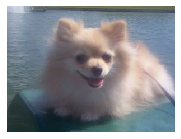

In [6]:
img = open_image(path/'images/pomeranian_123.jpg')
img.show()

In [7]:
# Converting a colored image to b/w
# dithering =True adds some noise to the image.
def black_white(fn, i):
    dest = path_lr/fn.relative_to(path_hr)
    dest.parent.mkdir(parents=True, exist_ok=True)
    img = Image.open(fn)
    img = img.convert('L')
    q=75 #which is default.the image quality is decreased.ranges from 0 to 95.
    img.save(dest, quality=q)

Uncomment the first time you run this nb

In [8]:
#parallel(black_white, il.items)

In [9]:
import os
os.listdir(path_lr)

['pomeranian_123.jpg',
 'Bengal_87.jpg',
 'Ragdoll_52.jpg',
 'wheaten_terrier_54.jpg',
 'samoyed_165.jpg',
 'Egyptian_Mau_87.jpg',
 'Sphynx_189.jpg',
 'Bengal_116.jpg',
 'Siamese_185.jpg',
 'staffordshire_bull_terrier_93.jpg',
 'pomeranian_9.jpg',
 'basset_hound_122.jpg',
 'chihuahua_152.jpg',
 'Ragdoll_210.jpg',
 'British_Shorthair_145.jpg',
 'Maine_Coon_35.jpg',
 'Ragdoll_34.jpg',
 'British_Shorthair_180.jpg',
 'keeshond_189.jpg',
 'Abyssinian_19.jpg',
 'newfoundland_165.jpg',
 'pomeranian_137.jpg',
 'Persian_58.jpg',
 'Russian_Blue_211.jpg',
 'basset_hound_120.jpg',
 'pomeranian_129.jpg',
 'Maine_Coon_126.jpg',
 'japanese_chin_185.jpg',
 'samoyed_71.jpg',
 'japanese_chin_143.jpg',
 'samoyed_110.jpg',
 'saint_bernard_102.jpg',
 'chihuahua_33.jpg',
 'pomeranian_183.jpg',
 'basset_hound_58.jpg',
 'Ragdoll_136.jpg',
 'scottish_terrier_43.jpg',
 'beagle_23.jpg',
 'great_pyrenees_160.jpg',
 'boxer_25.jpg',
 'english_setter_158.jpg',
 'boxer_48.jpg',
 'boxer_32.jpg',
 'havanese_167.jpg',
 

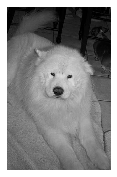

In [10]:
img = open_image(path_lr/'samoyed_165.jpg')
img.show()

In [11]:
bs, size = 32, 128
arch = models.resnet34
src = ImageImageList.from_folder(path_lr).split_by_rand_pct(0.1, seed=12)

In [12]:
def get_data(bs, size):
    data = (src.label_from_func(lambda x: path_hr/x.name)
           .transform(get_transforms(max_zoom=1.5), size=size, tfm_y=True)
           .databunch(bs=bs).normalize(imagenet_stats, do_y=True))
    data.c = 3 #rgb
    return data

In [13]:
data = get_data(bs, size)

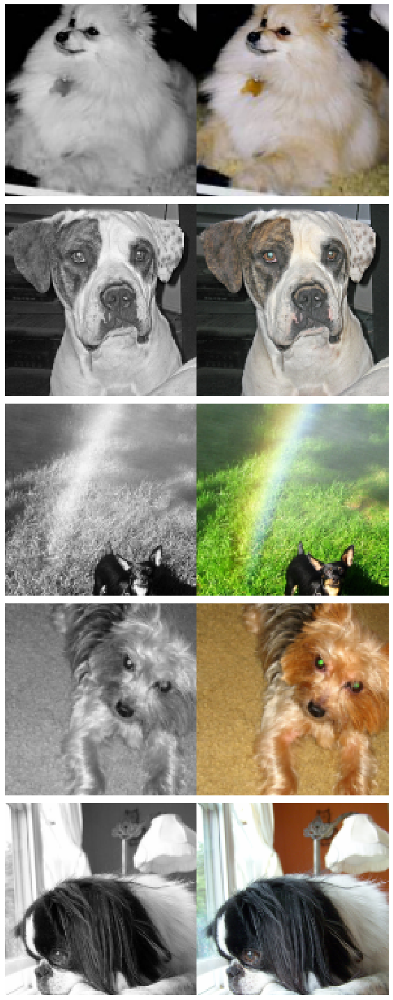

In [14]:
data.show_batch()

# Feature Loss

In [14]:
t = data.valid_ds[0][1].data; t.shape

torch.Size([3, 512, 512])

torch.stack concatenates two rtensors along a new dimension  
So if A and B are of shape (3, 4), torch.cat([A, B], dim=0) will be of shape (6, 4) and torch.stack([A, B], dim=0) will be of shape (2, 3, 4)

In [15]:
t = torch.stack([t,t]); t.shape

torch.Size([2, 3, 512, 512])

In [16]:
def gram_matrix(x):
    n,c,h,w = x.size()
    x = x.view(n, c, -1)
    return (x @ x.transpose(1,2))/(c*h*w)

In [17]:
n,c,h,w = t.size()
x = t.view(n,c,-1)
x.shape

torch.Size([2, 3, 262144])

In [18]:
x.transpose(1,2).shape

torch.Size([2, 262144, 3])

In [19]:
y = gram_matrix(t)
y.shape

torch.Size([2, 3, 3])

In [20]:
gram_matrix(t)

tensor([[[0.0826, 0.0754, 0.0622],
         [0.0754, 0.0692, 0.0575],
         [0.0622, 0.0575, 0.0486]],

        [[0.0826, 0.0754, 0.0622],
         [0.0754, 0.0692, 0.0575],
         [0.0622, 0.0575, 0.0486]]])

In [21]:
base_loss = F.l1_loss # can be either mse or l1

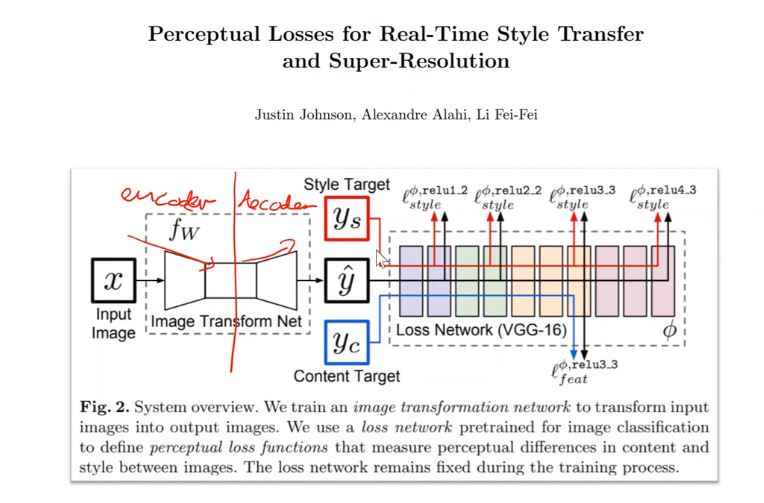

In [22]:
# vgg_bn is the pretrained model. The function .features in vgg contains the convolution part of the model.
# So we select that part of the model as we don't need the head of the model but only the intermediate activations
# We chuck it on the gpu and put into eval mode as we're not training it.
vgg_m = vgg16_bn(True).features.cuda().eval() 
requires_grad(vgg_m, False) #  we dont want to update the weights as we're just using in inference for calculating loss; 
# Hence we set it to False

In [23]:
# The grid size of the tensors changes in the max pooling layers of the vgg model.
# We wanna grab features from everytime just before the grid size changes hence the layer (i-1)
blocks = [i-1 for i,o in enumerate(children(vgg_m)) if isinstance(o,nn.MaxPool2d)] 
blocks, [vgg_m[i] for i in blocks]

([5, 12, 22, 32, 42],
 [ReLU(inplace=True),
  ReLU(inplace=True),
  ReLU(inplace=True),
  ReLU(inplace=True),
  ReLU(inplace=True)])

The output above is the list of the layer numbers just before the max pooling layers in the variable blocks.

In [24]:
class FeatureLoss(nn.Module):
    def __init__(self, m_feat, layer_ids, layer_wgts):
        super().__init__()
        self.m_feat = m_feat # the pretrained model. model which contains the features on which we want our feature losses
        self.loss_features = [self.m_feat[i] for i in layer_ids] # grabbing all layers from the network that we want features for
        self.hooks = hook_outputs(self.loss_features, detach=False) # grabbing intermediate layers by hooking 'em
        self.wgts = layer_wgts
        self.metric_names = ['pixel',] + [f'feat_{i}' for i in range(len(layer_ids))
              ] + [f'gram_{i}' for i in range(len(layer_ids))]

    def make_features(self, x, clone=False):
        self.m_feat(x)
        return [(o.clone() if clone else o) for o in self.hooks.stored]
    
    def forward(self, input, target):
        out_feat = self.make_features(target, clone=True) # passes target(actual y) to make_features which then calls the vgg model and go through all stored activations and grab a copy of em
        in_feat = self.make_features(input) # same thing for ip(which is the o/p of the generator).
        self.feat_losses = [base_loss(input,target)] # calculating l1 loss between the pixels as we still want it a little bit
        self.feat_losses += [base_loss(f_in, f_out)*w
                             for f_in, f_out, w in zip(in_feat, out_feat, self.wgts)] # going thorugh all the features and getting the l1 loss on them by grabbing the activations on each of them
        self.feat_losses += [base_loss(gram_matrix(f_in), gram_matrix(f_out))*w**2 * 5e3
                             for f_in, f_out, w in zip(in_feat, out_feat, self.wgts)]
        self.metrics = dict(zip(self.metric_names, self.feat_losses))
        return sum(self.feat_losses) # summing them all up
    
    def __del__(self): self.hooks.remove()

In [25]:
feat_loss = FeatureLoss(vgg_m, blocks[2:5], [5,15,2])

## Train

In [26]:
# the callback_fns prints out all the losses of different layers
# blur and norm_type in Part2
wd = 1e-3
learn = unet_learner(data, arch, wd=wd, loss_func=feat_loss, callback_fns=LossMetrics,
                     blur=True, norm_type=NormType.Weight).to_fp16()
gc.collect();

epoch,train_loss,valid_loss,pixel,feat_0,feat_1,feat_2,gram_0,gram_1,gram_2,time


LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


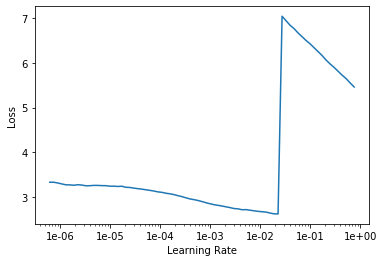

In [27]:
learn.lr_find()
learn.recorder.plot()

In [27]:
lr = 1e-2

In [28]:
def do_fit(save_name, lrs=slice(lr), pct_start=0.9):
    learn.fit_one_cycle(10, lrs, pct_start=pct_start)
    learn.save(save_name)
    learn.show_results(rows=1, imgsize=5)

epoch,train_loss,valid_loss,pixel,feat_0,feat_1,feat_2,gram_0,gram_1,gram_2,time
0,382887.125000,8.113894,1.393905,0.420475,0.508188,0.370887,1.813799,2.190928,1.415713,01:08
1,5765.153809,6.988745,0.818580,0.373693,0.498675,0.351695,1.512539,2.066394,1.367169,01:06
2,94.845032,6.890535,0.950686,0.353159,0.504128,0.339385,1.367809,2.014138,1.361231,01:06
3,7.384092,5.914811,0.510710,0.310683,0.460423,0.327110,1.108388,1.834825,1.362672,01:05
4,4.268476,3.751463,0.258748,0.183496,0.286737,0.219119,0.561721,1.186947,1.054697,01:06
5,4.036579,3.727111,0.276423,0.175756,0.281731,0.217690,0.547855,1.182647,1.045008,01:06
6,3.163204,3.238288,0.239950,0.140870,0.234943,0.195431,0.456201,0.999945,0.970948,01:06
7,3.141153,3.183913,0.223457,0.139966,0.232682,0.193732,0.445575,0.987343,0.961159,01:06
8,3.154306,3.214394,0.221250,0.139868,0.234506,0.194495,0.460374,0.995790,0.968112,01:06
9,3.010108,3.084620,0.202891,0.132724,0.224828,0.187223,0.440734,0.956961,0.939259,01:06


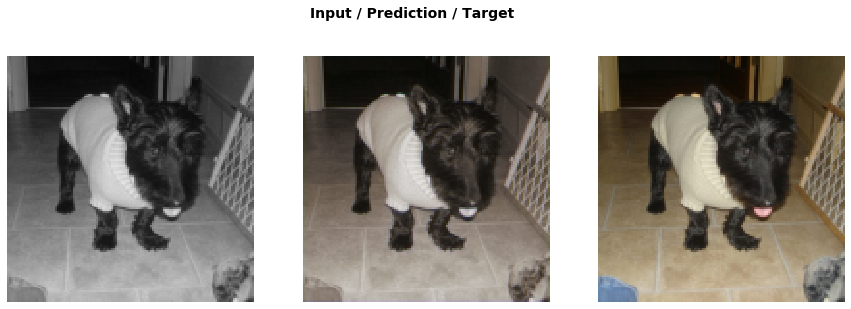

In [40]:
do_fit('1a', slice(lr*10))

epoch,train_loss,valid_loss,pixel,feat_0,feat_1,feat_2,gram_0,gram_1,gram_2,time


LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


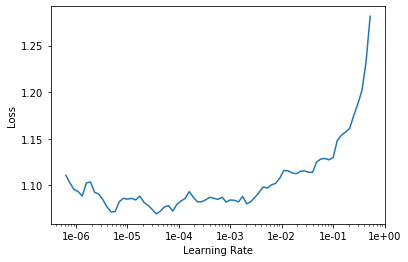

In [34]:
learn.unfreeze()
learn.lr_find()
learn.recorder.plot()

epoch,train_loss,valid_loss,pixel,feat_0,feat_1,feat_2,gram_0,gram_1,gram_2,time
0,2.991499,3.079847,0.203152,0.132964,0.224584,0.187093,0.439386,0.955146,0.937522,01:08
1,2.970172,3.078136,0.203858,0.132813,0.224174,0.187218,0.439462,0.951216,0.939395,01:08
2,2.983228,3.072760,0.203467,0.133399,0.224766,0.187022,0.436110,0.950169,0.937827,01:08
3,2.977111,3.067407,0.205047,0.133352,0.223979,0.186856,0.433667,0.945655,0.938850,01:08
4,2.970268,3.067809,0.207700,0.134713,0.225110,0.187418,0.426212,0.945701,0.940957,01:08
5,2.974864,3.065907,0.202881,0.133761,0.224773,0.186427,0.433311,0.950425,0.934328,01:08
6,2.971873,3.053526,0.203611,0.133777,0.223761,0.186573,0.430382,0.937738,0.937684,01:08
7,2.955500,3.048786,0.204345,0.134232,0.223301,0.186730,0.425976,0.935336,0.938866,01:08
8,2.961636,3.039395,0.204995,0.135354,0.224287,0.186070,0.418972,0.935622,0.934094,01:08
9,2.926354,3.019231,0.201089,0.133141,0.221790,0.184278,0.422316,0.929762,0.926855,01:08


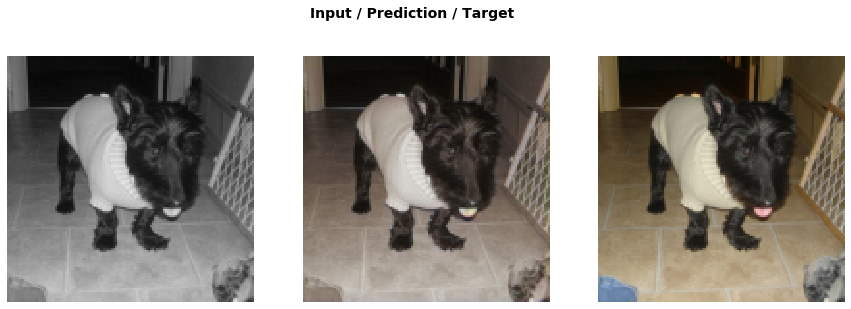

In [42]:
do_fit('1b', slice(1e-5, 1e-3))

In [32]:
data = get_data(24, 172)

In [29]:
learn.data = data
learn.freeze()
gc.collect()

244

epoch,train_loss,valid_loss,pixel,feat_0,feat_1,feat_2,gram_0,gram_1,gram_2,time
0,2.172915,2.235318,0.207438,0.134735,0.195818,0.146538,0.337305,0.620381,0.593104,02:18
1,2.173862,2.240674,0.206021,0.134008,0.195948,0.146636,0.340876,0.623006,0.594180,02:10
2,2.193702,2.263028,0.214687,0.137106,0.198192,0.147948,0.339302,0.625249,0.600543,02:10
3,2.176223,2.256026,0.206977,0.136243,0.197786,0.147977,0.339479,0.627314,0.600250,02:10
4,2.185433,2.256259,0.214550,0.136039,0.197559,0.147269,0.336719,0.626147,0.597975,02:10
5,2.174022,2.228397,0.205681,0.136769,0.196826,0.146493,0.330350,0.619154,0.593124,02:10
6,2.171137,2.223991,0.206749,0.133788,0.194675,0.145312,0.336037,0.618115,0.589315,02:10
7,2.161068,2.221621,0.208601,0.136369,0.196369,0.145997,0.328656,0.617991,0.587638,02:10
8,2.147089,2.213283,0.205463,0.137068,0.196612,0.146092,0.324470,0.616488,0.587089,02:10
9,2.111677,2.185396,0.203689,0.137264,0.195962,0.144926,0.315828,0.607763,0.579965,02:10


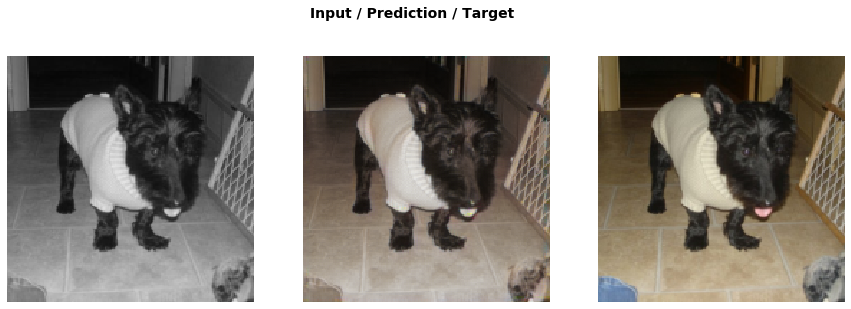

In [45]:
do_fit('2a', slice(lr*10, lr))

In [30]:
learn.load('2a');

In [33]:
learn.unfreeze()

epoch,train_loss,valid_loss,pixel,feat_0,feat_1,feat_2,gram_0,gram_1,gram_2,time
0,2.119843,2.184450,0.203644,0.136313,0.195147,0.144748,0.317661,0.606574,0.580363,02:24
1,2.119673,2.184320,0.203754,0.136268,0.195033,0.144763,0.317757,0.606182,0.580564,02:16
2,2.125671,2.183676,0.204117,0.136397,0.195197,0.144607,0.317341,0.606601,0.579415,02:16
3,2.119628,2.181626,0.203050,0.136192,0.195118,0.144636,0.317120,0.606093,0.579417,02:16
4,2.110304,2.180984,0.204072,0.136273,0.195017,0.144292,0.317149,0.606448,0.577733,02:16
5,2.113450,2.180298,0.203928,0.135846,0.194651,0.144349,0.318165,0.605063,0.578296,02:16
6,2.106508,2.179883,0.203837,0.135689,0.194530,0.144282,0.317960,0.604940,0.578645,02:16
7,2.090793,2.178323,0.202943,0.135336,0.193974,0.144120,0.319253,0.604215,0.578482,02:16
8,2.117860,2.176971,0.203460,0.135841,0.194245,0.144100,0.317049,0.604381,0.577894,02:16
9,2.091008,2.172889,0.203853,0.136545,0.194773,0.144104,0.314054,0.603437,0.576122,02:16


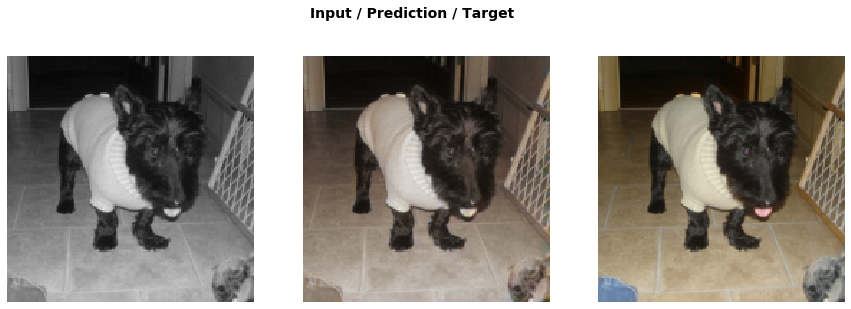

In [37]:
do_fit('2b', slice(1e-5, 1e-3))

In [30]:
data = get_data(16, 224)

In [31]:
learn.data = data
learn.freeze()
gc.collect()

153

epoch,train_loss,valid_loss,pixel,feat_0,feat_1,feat_2,gram_0,gram_1,gram_2,time
0,1.751907,1.758468,0.206772,0.138691,0.187635,0.119961,0.278109,0.475531,0.351768,03:16
1,1.745467,1.758558,0.206204,0.139302,0.187960,0.120252,0.275145,0.476976,0.352718,03:09
2,1.757133,1.758578,0.206043,0.137699,0.186268,0.119579,0.280967,0.475596,0.352426,03:09
3,1.753297,1.774655,0.207235,0.136869,0.186328,0.119687,0.288067,0.481231,0.355238,03:09
4,1.762396,1.767959,0.205804,0.138506,0.187835,0.120373,0.278905,0.480845,0.355692,03:09
5,1.770869,1.789322,0.209016,0.140593,0.189351,0.121788,0.282442,0.484861,0.361271,03:09
6,1.775608,1.783352,0.210236,0.138680,0.188188,0.120228,0.286033,0.486968,0.353020,03:09
7,1.764331,1.761163,0.205840,0.140503,0.188895,0.120549,0.273552,0.478341,0.353483,03:09
8,1.759848,1.782190,0.207153,0.136898,0.186126,0.119779,0.292189,0.484985,0.355059,03:09
9,1.722447,1.741758,0.204780,0.138916,0.186306,0.119182,0.271531,0.470429,0.350614,03:09


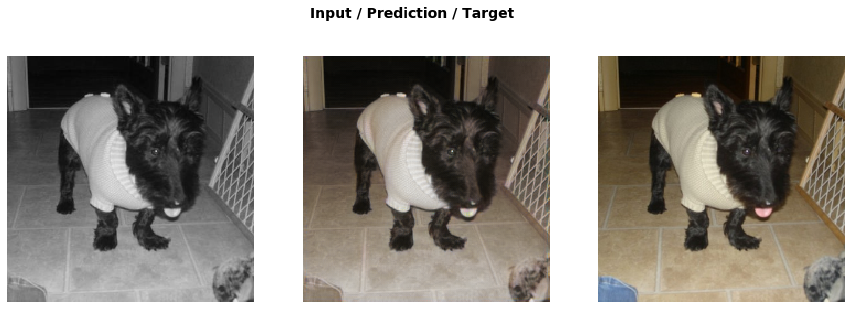

In [40]:
do_fit('3a', slice(lr*10, lr))

epoch,train_loss,valid_loss,pixel,feat_0,feat_1,feat_2,gram_0,gram_1,gram_2,time
0,1.732548,1.740585,0.205009,0.139244,0.186618,0.119171,0.270672,0.470095,0.349776,03:16
1,1.737880,1.740899,0.205266,0.139463,0.186786,0.119210,0.270243,0.469956,0.349975,03:16
2,1.728694,1.739738,0.205018,0.139290,0.186544,0.119168,0.270385,0.469711,0.349621,03:17
3,1.732679,1.739783,0.204941,0.138911,0.186265,0.118925,0.271662,0.469803,0.349276,03:16
4,1.746634,1.739971,0.204993,0.139179,0.186306,0.118916,0.271054,0.470156,0.349366,03:16
5,1.713101,1.740592,0.204733,0.139188,0.186269,0.119142,0.270653,0.469833,0.350775,03:16
6,1.733603,1.737630,0.205130,0.139065,0.186116,0.118868,0.270408,0.468820,0.349222,03:16
7,1.715580,1.737458,0.204895,0.138649,0.185779,0.118751,0.271394,0.468573,0.349418,03:16
8,1.725162,1.737840,0.205562,0.139678,0.186646,0.119140,0.268642,0.469088,0.349084,03:16
9,1.720308,1.735134,0.205008,0.139342,0.186277,0.118897,0.268595,0.468259,0.348754,03:16


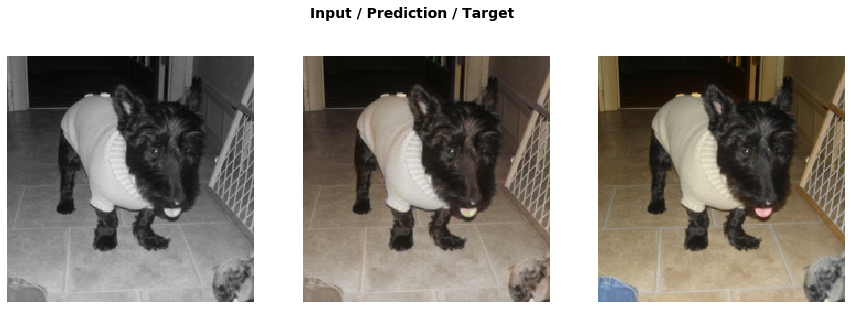

In [41]:
learn.unfreeze()
do_fit('3b', slice(1e-5, 1e-3))

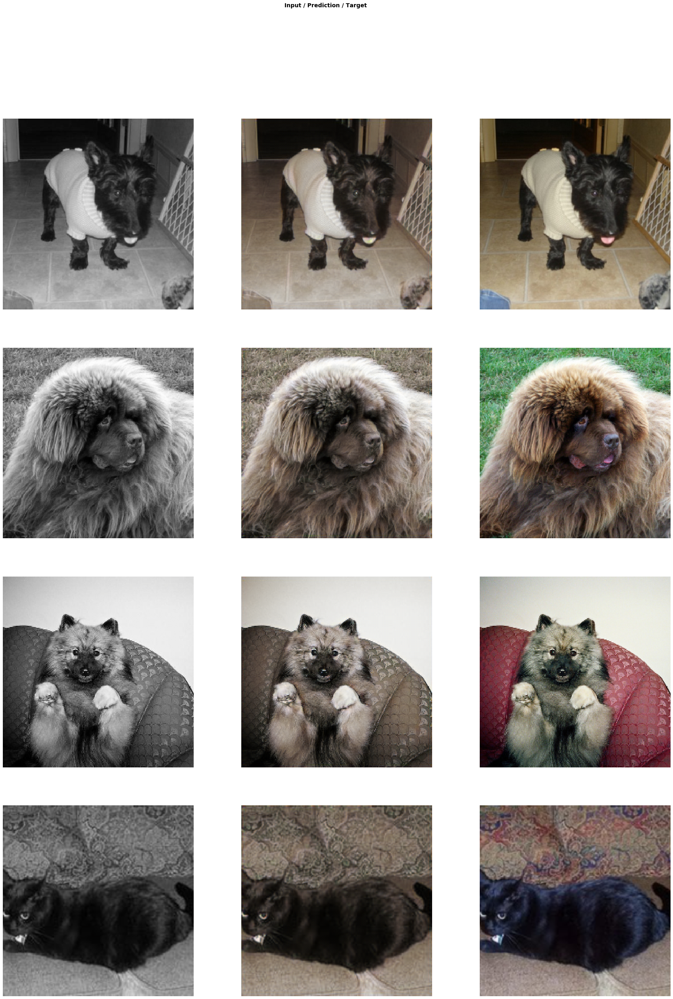

In [42]:
learn.show_results(rows=4, imgsize=10)

epoch,train_loss,valid_loss,pixel,feat_0,feat_1,feat_2,gram_0,gram_1,gram_2,time
0,1.716382,1.735157,0.204989,0.139043,0.185995,0.118816,0.269416,0.468152,0.348747,03:16
1,1.726974,1.734889,0.204965,0.139475,0.186343,0.118885,0.268257,0.468221,0.348742,03:16
2,1.723027,1.734893,0.204956,0.139419,0.186323,0.118894,0.268272,0.468190,0.348839,03:16
3,1.731099,1.734604,0.204957,0.139044,0.185957,0.118788,0.269307,0.467794,0.348757,03:16
4,1.731700,1.734955,0.204982,0.139469,0.186338,0.118929,0.268239,0.467945,0.349053,03:16
5,1.721785,1.735394,0.205041,0.139294,0.186193,0.118895,0.268790,0.468200,0.348981,03:16
6,1.720599,1.734981,0.204969,0.139344,0.186139,0.118863,0.268593,0.468109,0.348965,03:16
7,1.736534,1.734437,0.204875,0.139084,0.185958,0.118694,0.269375,0.468107,0.348344,03:17
8,1.728185,1.734321,0.204773,0.139133,0.185998,0.118842,0.268808,0.467963,0.348805,03:16
9,1.718467,1.733823,0.204806,0.139146,0.186016,0.118795,0.268755,0.467682,0.348622,03:16


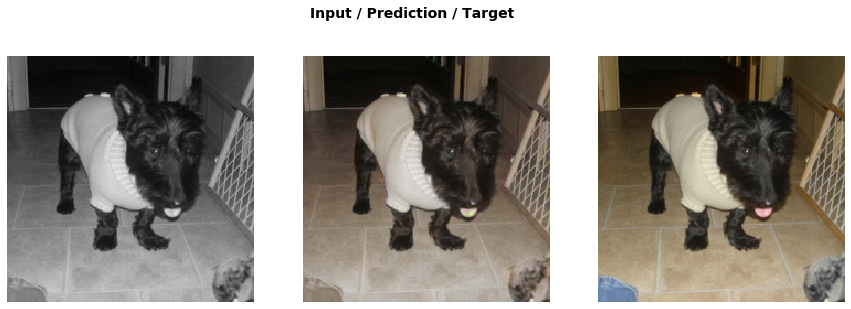

In [43]:
do_fit('3c', slice(1e-6, 1e-4))

In [31]:
data = get_data(16, 256)

In [32]:
learn.data = data
learn.freeze()
gc.collect()

7045

epoch,train_loss,valid_loss,pixel,feat_0,feat_1,feat_2,gram_0,gram_1,gram_2,time
0,1.563631,1.578403,0.204714,0.140644,0.181183,0.109435,0.253502,0.408632,0.280292,04:10
1,1.568867,1.579643,0.205609,0.139853,0.180229,0.109013,0.257110,0.408254,0.279575,03:56
2,1.571492,1.580469,0.205649,0.140578,0.180806,0.109217,0.255058,0.408909,0.280253,03:56
3,1.594835,1.586252,0.205468,0.140512,0.181052,0.109361,0.257658,0.411434,0.280767,03:56
4,1.588540,1.591192,0.207233,0.140152,0.181417,0.109454,0.258538,0.414340,0.280059,03:56
5,1.581554,1.596265,0.206079,0.138902,0.180000,0.109104,0.264745,0.415022,0.282413,03:56
6,1.583067,1.606093,0.207456,0.138914,0.180648,0.109574,0.266258,0.419798,0.283444,03:56
7,1.602007,1.585371,0.205481,0.141271,0.182356,0.109750,0.253678,0.411557,0.281278,03:56
8,1.581424,1.588688,0.206483,0.140161,0.181284,0.109822,0.257250,0.412098,0.281591,03:56
9,1.576430,1.573559,0.204785,0.139915,0.179824,0.108845,0.253598,0.407291,0.279300,03:56


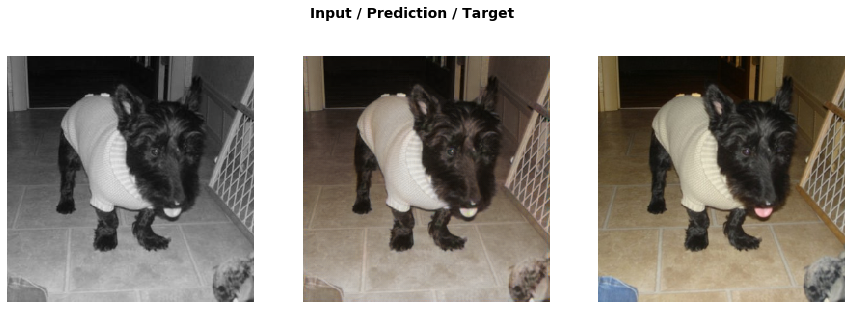

In [34]:
do_fit('4a', slice(lr*10, lr))

epoch,train_loss,valid_loss,pixel,feat_0,feat_1,feat_2,gram_0,gram_1,gram_2,time
0,1.559144,1.572444,0.204780,0.140367,0.180175,0.108970,0.251887,0.406806,0.279459,04:04
1,1.546765,1.571743,0.204717,0.140136,0.180026,0.108930,0.252064,0.406475,0.279394,04:04
2,1.559531,1.571202,0.204662,0.140281,0.180205,0.109012,0.251301,0.406129,0.279613,04:04
3,1.561056,1.570524,0.204583,0.140603,0.180413,0.109041,0.250320,0.405999,0.279563,04:04
4,1.556556,1.571082,0.204685,0.140344,0.180219,0.108980,0.251248,0.406214,0.279392,04:04
5,1.564605,1.570580,0.204507,0.140067,0.180003,0.108910,0.251721,0.406076,0.279296,04:04
6,1.557516,1.570191,0.204523,0.140120,0.180000,0.108892,0.251519,0.405958,0.279179,04:04
7,1.537368,1.569483,0.204620,0.140383,0.180259,0.108957,0.250423,0.405549,0.279293,04:04
8,1.550188,1.570518,0.204640,0.140532,0.180284,0.108993,0.250630,0.406171,0.279267,04:04
9,1.558181,1.569247,0.204515,0.140281,0.180120,0.108895,0.250652,0.405616,0.279167,04:04


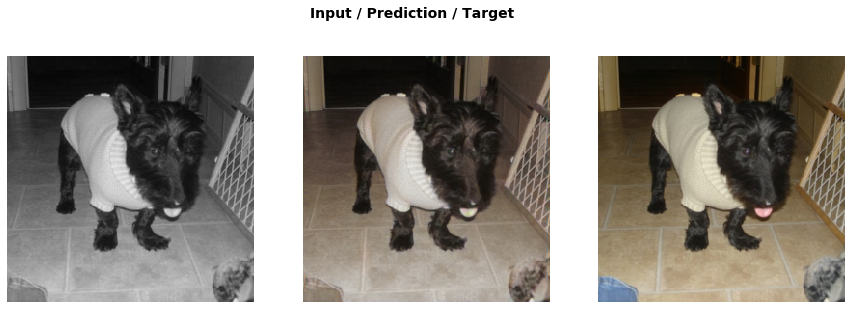

In [35]:
learn.unfreeze()
do_fit('4b', slice(1e-6, 1e-4))

In [13]:
data = get_data(4, 512)

In [29]:
learn.load('4b');

In [30]:
learn.data = data
learn.freeze()
gc.collect()

20

In [31]:
def do_fit(save_name, lrs=slice(lr), pct_start=0.9):
    learn.fit_one_cycle(3, lrs, pct_start=pct_start)
    learn.save(save_name)
    learn.show_results(rows=1, imgsize=5)

epoch,train_loss,valid_loss,pixel,feat_0,feat_1,feat_2,gram_0,gram_1,gram_2,time
0,1.106462,1.080875,0.205005,0.145572,0.165907,0.069632,0.194817,0.211737,0.088205,19:03
1,1.101186,1.092963,0.206983,0.142070,0.163779,0.069677,0.205823,0.215392,0.089239,18:47
2,1.048859,1.068632,0.203943,0.144172,0.164452,0.069511,0.189154,0.208943,0.088457,18:47


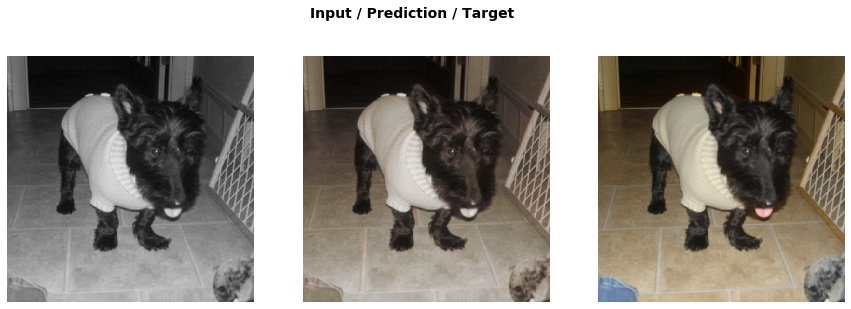

In [32]:
do_fit('5a', slice(lr*10, lr))

epoch,train_loss,valid_loss,pixel,feat_0,feat_1,feat_2,gram_0,gram_1,gram_2,time
0,1.075387,1.077994,0.207286,0.144977,0.165343,0.069570,0.190719,0.211629,0.088470,18:47
1,1.101545,1.077988,0.205641,0.145660,0.166577,0.070151,0.188009,0.213245,0.088705,18:47
2,1.067701,1.063055,0.204243,0.144043,0.163866,0.069054,0.186311,0.207273,0.088264,18:47


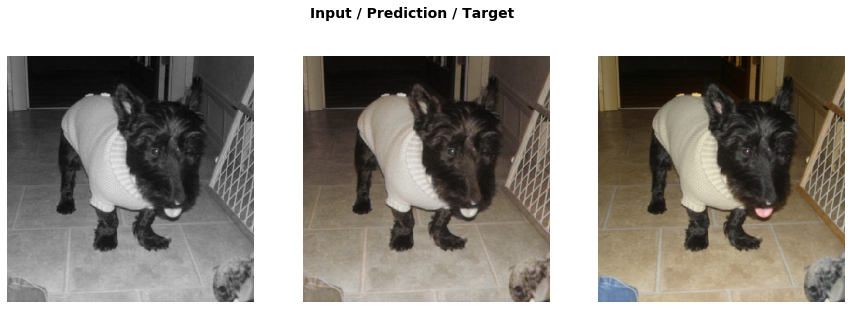

In [33]:
do_fit('5b', slice(lr*10, lr))

epoch,train_loss,valid_loss,pixel,feat_0,feat_1,feat_2,gram_0,gram_1,gram_2,time
0,1.058408,1.062008,0.204025,0.144694,0.164342,0.069195,0.184447,0.207023,0.088283,19:29
1,1.062669,1.061475,0.203790,0.144396,0.164073,0.069129,0.184873,0.206938,0.088276,19:29
2,1.047189,1.061368,0.203744,0.144385,0.164132,0.069202,0.184778,0.206880,0.088247,19:30


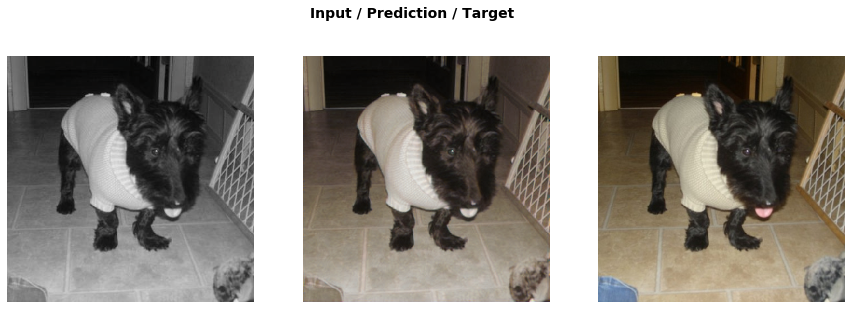

In [35]:
learn.unfreeze()
do_fit('5c', slice(4e-6, 4e-5))

epoch,train_loss,valid_loss,pixel,feat_0,feat_1,feat_2,gram_0,gram_1,gram_2,time
0,1.061961,1.061498,0.203563,0.144143,0.163885,0.069128,0.185562,0.206882,0.088334,19:30
1,1.038318,1.061592,0.203632,0.144120,0.163808,0.069132,0.185610,0.206980,0.088309,19:30
2,1.064871,1.061029,0.203900,0.144232,0.163967,0.069132,0.184989,0.206699,0.088110,19:29


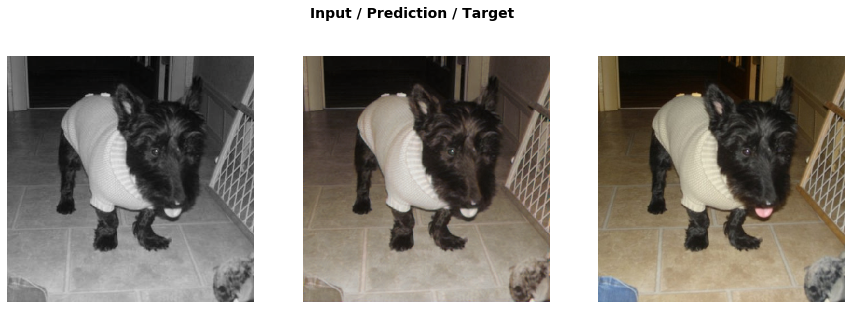

In [36]:
do_fit('5d', slice(4e-6, 4e-5))

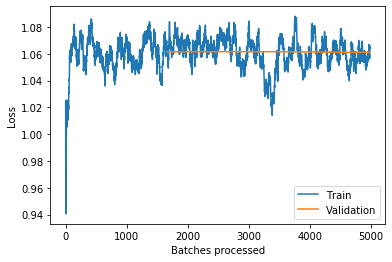

In [37]:
learn.recorder.plot_losses()

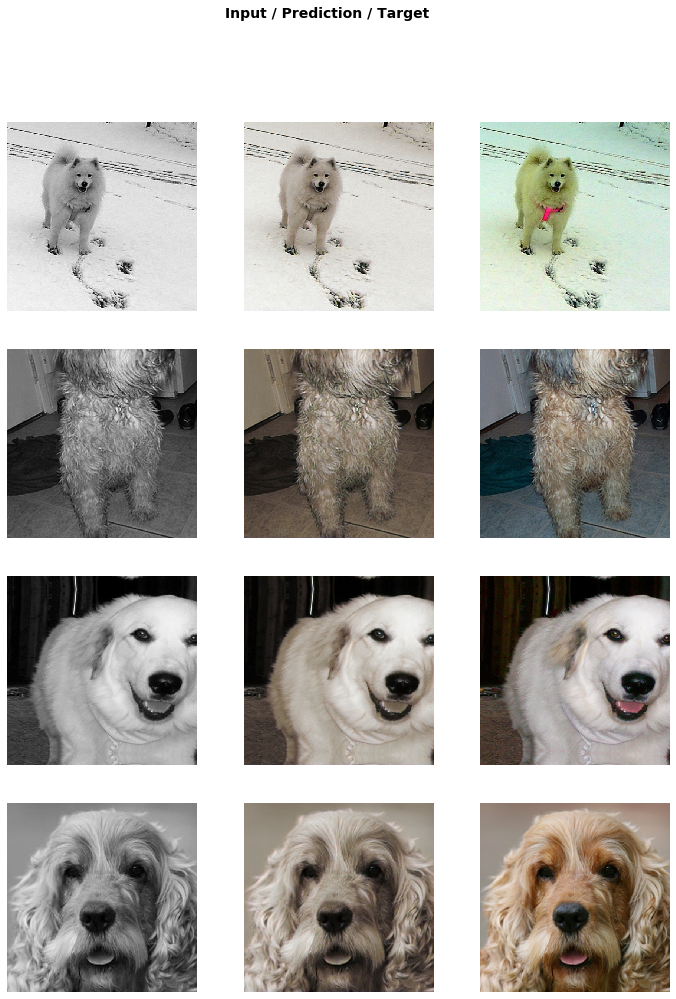

In [41]:
learn.show_results(ds_type = DatasetType.Train)

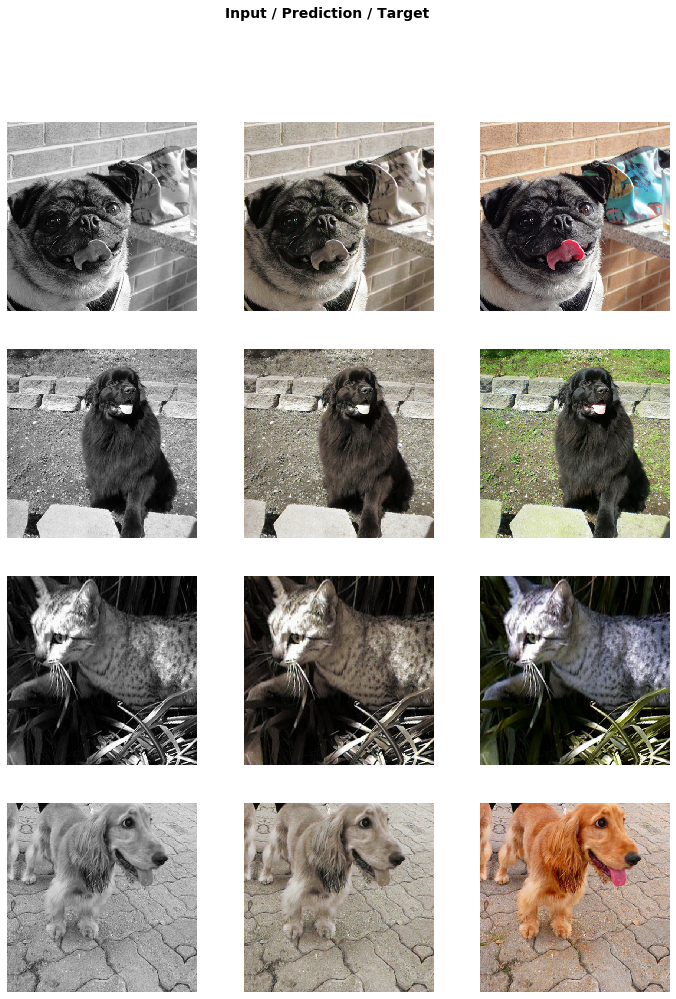

In [42]:
learn.show_results(ds_type = DatasetType.Train)

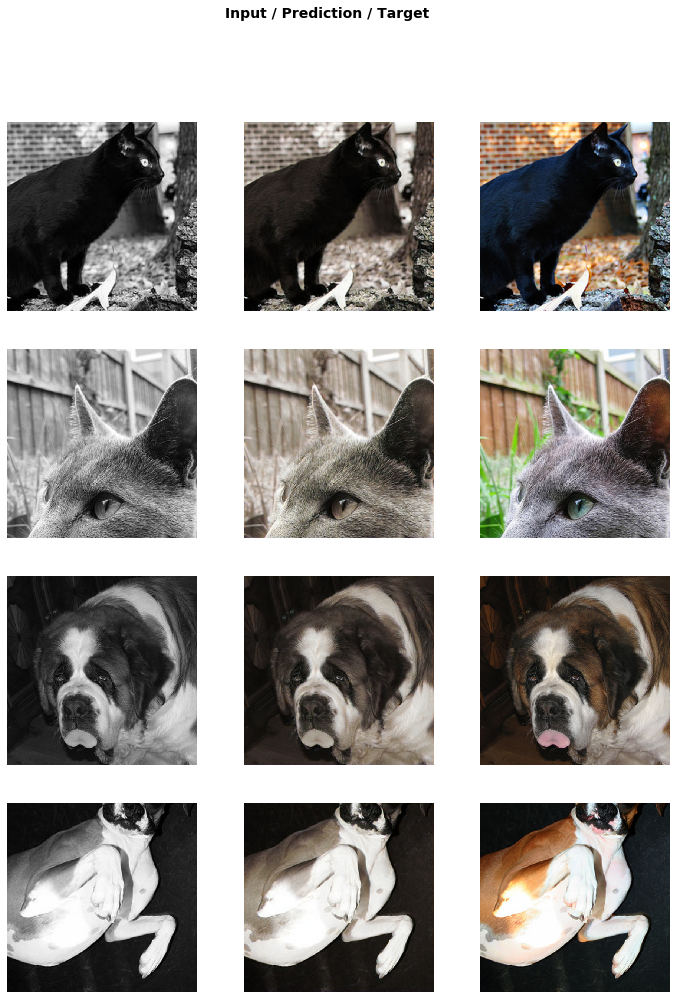

In [129]:
learn.show_results(ds_type = DatasetType.Train)

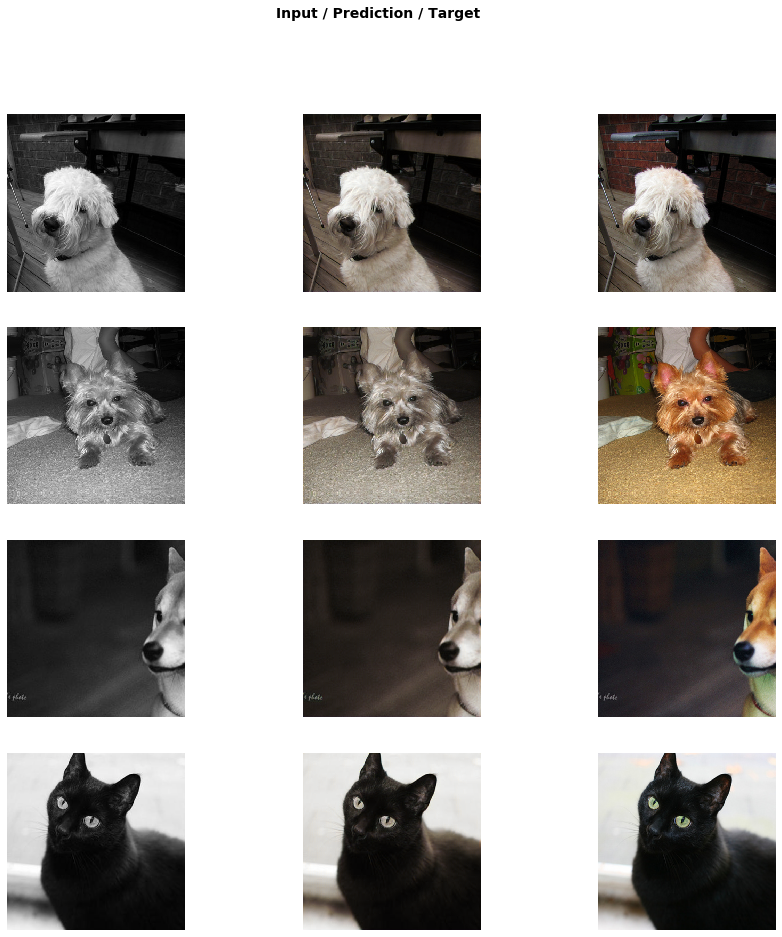

In [134]:
learn.show_results(ds_type = DatasetType.Train, figsize=(15,15))

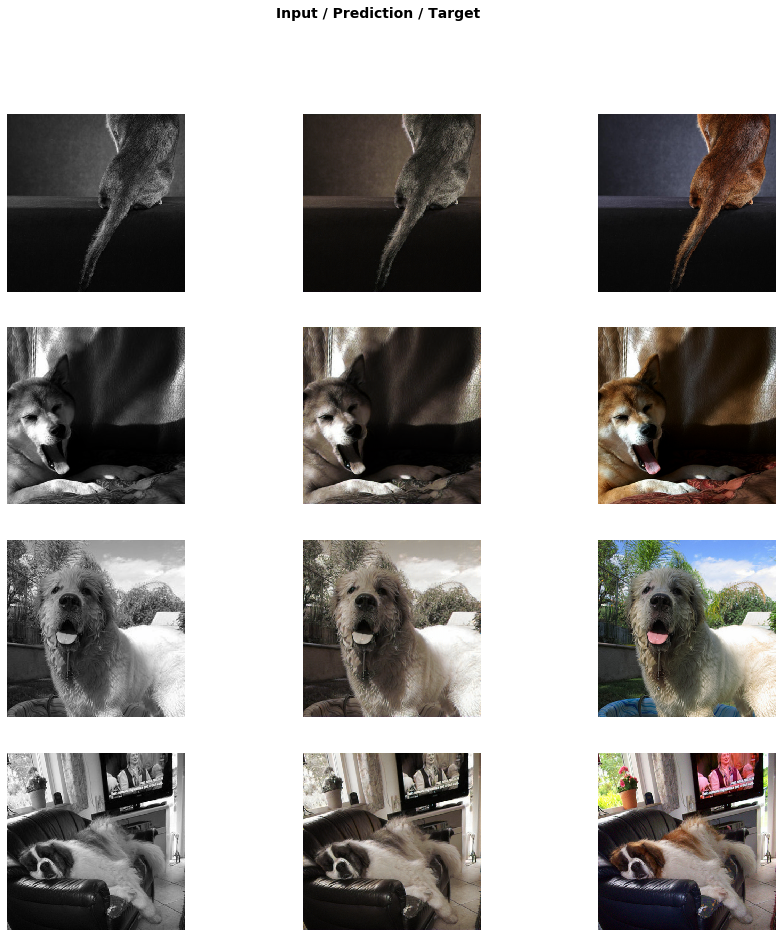

In [140]:
learn.show_results(ds_type = DatasetType.Train, figsize=(15,15))